In [1]:
import sys
from pathlib import Path

project_root = Path("/home/atibisiklet/major_proj/OptiCommPy")
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

import numpy as np
import matplotlib.pyplot as plt
from scipy.special import erfc
from scipy import signal
from scipy import constants as const
import tensorflow as tf
from tensorflow.keras import layers, Model, initializers, Sequential

from optic.models.devices import mzm, photodiode, edfa, iqm, coherentReceiver, pdmCoherentReceiver, basicLaserModel
from optic.models.channels import linearFiberChannel, ssfm
from optic.comm.modulation import modulateGray, grayMapping
from optic.comm.sources import bitSource, symbolSource
from optic.dsp.core import upsample, pulseShape, pnorm, anorm, signalPower, firFilter, decimate, symbolSync,phaseNoise, gaussianComplexNoise

try:
    from optic.dsp.coreGPU import checkGPU
    if checkGPU():
        from optic.dsp.coreGPU import firFilter
    else:
        from optic.dsp.core import firFilter
except ImportError:
    from optic.dsp.core import firFilter

from optic.utils import parameters, dBm2W, ber2Qfactor
from optic.plot import eyediagram, pconst, plotPSD

from tqdm.notebook import tqdm
import scipy as sp
import scipy.constants as const

try:
    from optic.models.modelsGPU import manakovSSF
except:
    from optic.models.channels import manakovSSF

from optic.dsp.equalization import edc, mimoAdaptEqualizer, ffe
from optic.dsp.carrierRecovery import cpr
from optic.comm.metrics import fastBERcalc, monteCarloGMI, monteCarloMI, calcEVM, bert
from optic.dsp.clockRecovery import gardnerClockRecovery


import logging as logg
logg.basicConfig(level=logg.INFO, format='%(message)s', force=True)
import time

I0000 00:00:1774882140.540975   10360 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
I0000 00:00:1774882140.618465   10360 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1774882142.160081   10360 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [2]:
from IPython.core.display import HTML
from IPython.core.pylabtools import figsize

HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [3]:
# --------------------------------------------------------------------------------------------------------------------------------------
# Power Amplifier (PA) Functions
# ---------------------------------------------------------------------------------------------------------------------------------------

def rapp_pa(x, Vsat, p=2.0):
    """
    Memoryless Rapp PA model for complex baseband input.

    Parameters
    ----------
    x : np.ndarray
        Complex input waveform in volts.
    Vsat : float
        Saturation voltage/amplitude.
    p : float
        Rapp smoothness exponent.

    Returns
    -------
    y : np.ndarray
        Output after memoryless PA nonlinearity.
    """
    mag = np.abs(x)
    gain = 1.0 / (1.0 + (mag / Vsat) ** (2 * p)) ** (1.0 / (2 * p))
    return x * gain


def butter_lpf_complex(x, Fs, f3dB, order=3):
    """
    Apply an order-N Butterworth LPF to a complex baseband waveform.
    """
    wn = f3dB / (Fs / 2)

    if wn >= 1.0:
        raise ValueError(
            f"Butterworth cutoff must be below Nyquist. Got f3dB={f3dB/1e9:.2f} GHz, "
            f"Fs/2={(Fs/2)/1e9:.2f} GHz."
        )

    b, a = signal.butter(order, wn, btype='low')

    y_i = signal.lfilter(b, a, np.real(x))
    y_q = signal.lfilter(b, a, np.imag(x))

    return y_i + 1j * y_q


def pa_model_physical(x, Fs, gain_linear, BLPF_enable, BO_dB=5.0, p=2.0, f3dB=10e9, order=3):
    """
    Physical PA model:
        x -> linear gain -> Rapp compression -> Butterworth LPF

    Parameters
    ----------
    x : np.ndarray
        Complex baseband input waveform (dimensionless DSP waveform).
    Fs : float
        Sample rate [Hz].
    gain_linear : float
        Small-signal linear voltage gain. This sets the nominal IQM drive level.
    BO_dB : float
        Back-off in dB, used to set Vsat relative to the RMS value AFTER gain.
    p : float
        Rapp exponent.
    f3dB : float
        PA 3-dB bandwidth [Hz].
    order : int
        Butterworth filter order.

    Returns
    -------
    y : np.ndarray
        PA output waveform in volts, ready to drive the IQM.
    info : dict
        Diagnostic information.
    """

    # 1) Linear gain stage -> now waveform is in volts
    x_amp = gain_linear * x

    # 2) Compute RMS after gain
    Vrms_in = np.sqrt(np.mean(np.abs(x_amp) ** 2))

    # 3) Saturation voltage from back-off
    Vsat = Vrms_in * 10 ** (BO_dB / 20)

    # 4) Nonlinear compression
    y_nl = rapp_pa(x_amp, Vsat=Vsat, p=p)

    # 5) PA bandwidth limitation
    if BLPF_enable:
        y = butter_lpf_complex(y_nl, Fs=Fs, f3dB=f3dB, order=order)
    else:
        y = y_nl

    info = {
        "gain_linear": gain_linear,
        "Vrms_in_V": Vrms_in,
        "Vsat_V": Vsat,
        "BO_dB": BO_dB,
        "p": p,
        "f3dB_Hz": f3dB,
        "peak_out_V": np.max(np.abs(y)),
        "rms_out_V": np.sqrt(np.mean(np.abs(y) ** 2)),
    }

    return y, info

In [4]:
def select_cpr_mode(paramCPR_, CPR_Mode, Ts, M):
    paramCPR = paramCPR_
    paramCPR.Ts = Ts
    paramCPR.M  = M
    paramCPR.returnPhases = True

    if CPR_Mode.lower() == "bps":
        paramCPR.alg = "bps"
        if M == 16:
            paramCPR.N = 25
            paramCPR.B = 64
        elif M == 32:
            paramCPR.N = 31
            paramCPR.B = 128
        elif M == 64:
            #paramCPR.N = 81
            paramCPR.N = 101
            paramCPR.B = 2048
            #paramCPR.B = 1024
        elif M == 256:
            paramCPR.N = 81
            paramCPR.B = 512

    elif CPR_Mode.lower() == "ddpll":
        paramCPR.alg = "ddpll"
        if M == 16:
            # recommended DDPLL parameters
            paramCPR.tau1 = 1/(2*np.pi*10e3)
            paramCPR.tau2 = 1/(2*np.pi*10e3)
            paramCPR.Kv   = 0.1
        elif M == 32:
            paramCPR.tau1 = 1/(2*np.pi*20e3)
            paramCPR.tau2 = 1/(2*np.pi*20e3)
            paramCPR.Kv   = 0.1
            
        elif M == 64:
            #paramCPR.tau1 = 1/(2*np.pi*30e3)
            #paramCPR.tau2 = 1/(2*np.pi*30e3)
            #paramCPR.Kv   = 0.15
            paramCPR.Kv = 0.07
            paramCPR.tau1 = 1/(2*np.pi*5e6)
            paramCPR.tau2 = 1/(2*np.pi*5e6)
        elif M == 256:
            paramCPR.tau1 = 1/(2*np.pi*40e3)
            paramCPR.tau2 = 1/(2*np.pi*40e3)
            paramCPR.Kv   = 0.12  # faster tracking needed
          
    else:
        raise ValueError("CPR_Mode must be 'bps' or 'ddpll'")

    return paramCPR

In [5]:
def select_equalizer_mode(M, Data_Aided, paramEq_):
    """
    Selects the equalizer algorithm and step sizes 
    based on M, Data_Aided flag, and chosen mode.
    """
    paramEq = paramEq_
    if Data_Aided:
        if M == 4:
            # For QPSK
            paramEq.alg = ['cma', 'cma']
            paramEq.mu  = [5e-3, 1e-3]
            paramEq.numIter = 2
        elif M == 16:
            # For 16-QAM
            paramEq.alg = ['da-rde', 'rde']
            paramEq.mu  = [5e-3, 5e-4]
            paramEq.numIter = 3
        elif M == 32:
            paramEq.alg = ['da-rde', 'rde']
            paramEq.mu  = [2e-3, 5e-4]
            paramEq.numIter = 4
            paramEq.nTaps = 45
        elif M == 64:
            paramEq.alg = ['da-rde', 'rde']
            paramEq.mu  = [8e-4, 4e-4]
            paramEq.mu  = [8e-4, 3e-4]
            paramEq.numIter = 6
            paramEq.nTaps = 65
            #paramEq.alg = ['da-rde', 'cma']
            #paramEq.mu = [3e-4, 5e-5]
            #paramEq.numIter = 4
            #paramEq.nTaps = 85
        elif M == 256:
            paramEq.alg = ['da-rde', 'da-rde']
            paramEq.mu  = [2e-3, 5e-4]
            paramEq.numIter = 6
            paramEq.nTaps = 180
            
            
    else:  # Blind mode
        if M == 4:
            paramEq.alg = ['cma','cma']
            paramEq.mu  = [5e-3, 1e-3]
            paramEq.numIter = 2
        elif M == 16:
            paramEq.alg = ['cma','rde']
            paramEq.mu  = [5e-3, 1e-3]
            paramEq.numIter = 3
        elif M == 32:
            paramEq.alg = ['cma','rde']
            paramEq.mu  = [2e-3, 5e-4]
            paramEq.numIter = 4
            paramEq.nTaps = 45
        elif M == 64:
            paramEq.alg = ['cma', 'rde']
            paramEq.mu  = [1e-3, 1e-3]
            paramEq.numIter = 5
            paramEq.nTaps = 55
        elif M == 256:
            paramEq.alg = ['cma', 'rde']
            paramEq.mu  = [5e-4, 5e-4]
            paramEq.numIter = 6
            paramEq.nTaps = 65
   
            
    return paramEq

In [6]:
def perf_calc(symbTx, y_CPR_1, d_, M, paramSymb):
    """Performance Metric Exploration for Single Polarization"""
    d = d_
    discard = 5000
    ind = np.arange(discard, len(symbTx) - discard)
    
    # Remove phase ambiguity for all M (optional: for QAM)
    if M in [4, 16, 32, 64, 128]:
        d = symbTx  # or processed reference symbols

    # Compute metrics
    BER, SER, SNR = fastBERcalc(y_CPR_1[ind], d[ind], M, 'qam', px=paramSymb.px)
    EVM = calcEVM(y_CPR_1[ind], M, 'qam', d[ind])
    Qfactor = ber2Qfactor(BER[0])

    print(' SER: %.3e,  '%(SER[0]))
    print(' BER: %.3e   '%(BER[0]))
    print(' SNR: %.3f dB'%(SNR[0]))
    print(' EVM: %.3f %%'%(EVM[0]*100))
    print(' Qfactor: %.3f,  '%(Qfactor))

    return BER[0], SER[0], SNR[0], EVM[0], Qfactor

In [ ]:
# ----------------------------------------------
# Simulation of the Optical System (parametric version)
# -----------------------------------------------

def simulate_optical_system(
    symbTx,
    no_symbols_sent,
    M,
    PA_enable=True,
    Data_Aided=True,
    SpS=16,
    SpSout=2,
    Fs=None,
    mzmScale=0.5,
    Vpi=2,
    BLPF_enable=True,
    PA_BO_dB=3,
    PA_p=2.0,
    PA_f3dB=18.5e9,
    P_launch_dBm=0,
    Rs = 32e9,                
    rollOff = 0.01,           
    nFilterTaps = 1024,       
    laserLinewidth = 100e3, 
    FO  = -128e6,
    CPR_Mode = "bps",
    pulse_type="rrc",
    ch_Ltotal_km=80,
    ch_Lspan_km=80,
    ch_alpha_dB_per_km=0.2,
    ch_D_ps_nm_km=16,
    ch_gamma=1.3,
    ch_Fc=193.1e12,
    ch_hz_km=0.5,
    ch_prgsBar=True,
    ch_amp="edfa",
    ch_NF_dB=4.5,
    lo_P_dBm=2,
    lo_linewidth_hz=100e3,
    lo_RIN_var=0,
    lo_freq_shift_base_hz=0,
    pn_tx_seed=123,
    lo_rx_seed=789,
    pd_seed=1011,
    pd_ideal=True,
    edc_Fs=None,
    pa_order=3,
    ):                
    
    # (derived) params
    if Fs is None:
        Fs = Rs * SpS
    # 3) UpSampling and FIR Parameters
    paramPulse = parameters()
    paramPulse.pulseType = pulse_type
    paramPulse.nFilterTaps = nFilterTaps
    paramPulse.rollOff = rollOff
    paramPulse.SpS = SpS

    # 4) IQM Parameters
    paramIQM = parameters()
    paramIQM.Vpi = Vpi
    paramIQM.VbI = -Vpi
    paramIQM.VbQ = -Vpi
    paramIQM.Vphi = Vpi/2

    # 5) Optical Carrier / LO field (Ein)
    sigTx_length = no_symbols_sent * SpS
    if laserLinewidth and laserLinewidth > 0:
        phi_pn = phaseNoise(laserLinewidth, sigTx_length, 1 / Fs, seed=pn_tx_seed)
        sigLO = np.exp(1j * phi_pn)
    else:
        sigLO = np.ones_like(sigTx_length, dtype=complex)


    # -----------------------------------------------
    # Channel Parameters
    #------------------------------------------------

    # 1) Optical Channel Parameters
    #paramCh = parameters()
    #paramCh.Ltotal = ch_Ltotal_km
    #paramCh.Lspan = ch_Lspan_km
    #paramCh.alpha = ch_alpha_dB_per_km
    #paramCh.D = ch_D_ps_nm_km
    #paramCh.gamma = ch_gamma
    #paramCh.Fc = ch_Fc
    #paramCh.hz = ch_hz_km
    #paramCh.prgsBar = ch_prgsBar
    #paramCh.Fs = Fs
    #paramCh.amp = ch_amp
    #paramCh.NF = ch_NF_dB
    #paramCh.seed = 456

    paramASE = parameters()
    paramASE.nStages = 1              # number of EDFA stages to simulate (1-10)
    paramASE.G = 20.0                 # gain per stage in dB (for noise calculation only)
    paramASE.NF = 4.5                 # noise figure per stage in dB (scalar or list)
    paramASE.Fc = 193.1e12            # central optical frequency [Hz]
    paramASE.Fs = Rs * SpS            # sampling frequency [Hz]
    paramASE.seed = 456   


    # -----------------------------------------------
    # Receiver Parameters
    #------------------------------------------------

    # 1) local oscillator (LO) parameters:

    paramLO = parameters()
    paramLO.P = lo_P_dBm
    paramLO.lw = lo_linewidth_hz
    paramLO.RIN_var = lo_RIN_var
    paramLO.Fs = Fs
    paramLO.seed = lo_rx_seed
    paramLO.freqShift = lo_freq_shift_base_hz + FO

    # 2) Front-End Parameters and photodiode paramters

    # Frontend parameters
    paramFE = parameters()
    paramFE.Fs = Fs

    # Photodiodes parameters
    paramPD = parameters()
    paramPD.B = Rs
    paramPD.Fs = Fs
    paramPD.ideal = pd_ideal
    paramPD.seed = pd_seed

    # 3) Pulseshaping in the reciever using rrc filter
    paramRxPulse = parameters()
    paramRxPulse.SpS = SpS
    paramRxPulse.nFilterTaps = nFilterTaps
    paramRxPulse.rollOff = rollOff
    paramRxPulse.pulseType = pulse_type

    # 4) Decimation Parameters
    paramDec = parameters()
    paramDec.SpSin  = SpS
    paramDec.SpSout = SpSout

    # 5) Chromatic Dispersion Parameters
    #paramEDC = parameters()
    #paramEDC.L = paramCh.Ltotal
    #paramEDC.D = paramCh.D
    #paramEDC.Fc = paramCh.Fc
    #paramEDC.Rs = Rs
    #paramEDC.Fs = 2 * Rs if edc_Fs is None else edc_Fs

    # 6) Adaptive Equalization Parameters
    paramEq = parameters()
    paramEq.nTaps = 35
    paramEq.SpS = paramDec.SpSout
    paramEq.numIter = 2
    paramEq.storeCoeff = False
    paramEq.M = M
    paramEq.shapingFactor = 0
    paramEq.constType = "qam"
    paramEq.prgsBar = False

    # 7) Data-Aided or Blind Reciever Equalization
    # Can be set here or not
    #Data_Aided = True

    # 8) Carrier and Phase recovery parameters using bps
    paramCPR = parameters()
    paramCPR.alg = 'bps'
    paramCPR.M   = M
    paramCPR.constType ="qam"
    paramCPR.shapingFactor = 0
    paramCPR.N   = 25
    paramCPR.B   = 64
    paramCPR.returnPhases = True
    paramCPR.Ts = 1/Rs




    # -----------------------------------------------------------------------------------------------------------------------------------------------------
    # TRANSMITTER

    # 2) Upsampling + pulse shaping
    pulse = pulseShape(paramPulse)
    symbolsUp = upsample(symbTx, SpS)
    sigTx = firFilter(pulse, symbolsUp)

    # 3) Choose nominal small-signal PA gain so the nominal drive is around mzmScale * Vpi
    target_peak_V = mzmScale * Vpi
    peak_sigTx = np.max(np.abs(sigTx))

    if peak_sigTx == 0:
        raise ValueError("sigTx peak is zero; cannot set PA gain.")

    gain_linear = target_peak_V / peak_sigTx

    # 4) Driver amplifier / PA output directly in volts
    if PA_enable:
        u_drive, paInfo = pa_model_physical(
            sigTx,
            Fs=Fs,
            gain_linear=gain_linear,
            BLPF_enable=BLPF_enable,
            BO_dB=PA_BO_dB,
            p=PA_p,
            f3dB=PA_f3dB,
            order=pa_order,
        )
    else:
        u_drive = gain_linear * sigTx
        paInfo = {
            "gain_linear": gain_linear,
            "Vrms_in_V": np.sqrt(np.mean(np.abs(u_drive) ** 2)),
            "Vsat_V": None,
            "BO_dB": None,
            "p": None,
            "f3dB_Hz": None,
            "peak_out_V": np.max(np.abs(u_drive)),
            "rms_out_V": np.sqrt(np.mean(np.abs(u_drive) ** 2)),
        }

    # 5) IQ modulation: PA output drives the IQM directly
    sigTxo = iqm(sigLO, u_drive, paramIQM)

    # 6) Set launched optical power
    P_launch_W = dBm2W(P_launch_dBm)
    sigTxo = np.sqrt(P_launch_W) * pnorm(sigTxo)

    # End of Transmitter
    # -----------------------------------------------------------------------------------------------------------------------------------------------------

    # -----------------------------------------------------------------------------------------------------------------------------------------------------
    # CHANNEL

    #sigCh = ssfm(sigTxo, paramCh)
    
    
    # Parameter Validation
    # Validate number of EDFA stages
    if not (1 <= paramASE.nStages <= 10):
        raise ValueError(
            f"Number of EDFA stages must be between 1 and 10, got {paramASE.nStages}"
        )
    
    # Convert scalar G and NF to lists if needed
    if np.isscalar(paramASE.G):
        G_list = [paramASE.G] * paramASE.nStages
    else:
        G_list = list(paramASE.G)
        if len(G_list) != paramASE.nStages:
            raise ValueError(
                f"Length of G list ({len(G_list)}) must match nStages ({paramASE.nStages})"
            )
    
    if np.isscalar(paramASE.NF):
        NF_list = [paramASE.NF] * paramASE.nStages
    else:
        NF_list = list(paramASE.NF)
        if len(NF_list) != paramASE.nStages:
            raise ValueError(
                f"Length of NF list ({len(NF_list)}) must match nStages ({paramASE.nStages})"
            )
    
    # Validate gain values (must be positive)
    for i, G in enumerate(G_list):
        if G <= 0:
            raise ValueError(
                f"EDFA gain must be positive, got {G} dB for stage {i}"
            )
    
    # Validate noise figure values (must be >= 3 dB)
    for i, NF in enumerate(NF_list):
        if NF < 3:
            raise ValueError(
                f"EDFA noise figure must be >= 3 dB, got {NF} dB for stage {i}"
            )
    
    # Validate carrier frequency and sampling frequency
    if paramASE.Fc <= 0:
        raise ValueError(
            f"Carrier frequency must be positive, got {paramASE.Fc} Hz"
        )
    
    if paramASE.Fs <= 0:
        raise ValueError(
            f"Sampling frequency must be positive, got {paramASE.Fs} Hz"
        )
    

    sigCh = sigTxo.copy()

    # Add ASE noise from each stage
    # In back-to-back: just add noise, no amplification
    for i in range(paramASE.nStages):
        # Convert gain and noise figure to linear scale
        G_lin = 10 ** (G_list[i] / 10)
        NF_lin = 10 ** (NF_list[i] / 10)
        
        # Calculate spontaneous emission factor (nsp)
        # nsp = (G * NF - 1) / (2 * (G - 1))
        nsp = (G_lin * NF_lin - 1) / (2 * (G_lin - 1))
        
        # Calculate ASE noise power spectral density
        # N_ase = (G - 1) * nsp * h * Fc [W/Hz]
        N_ase = (G_lin - 1) * nsp * const.h * paramASE.Fc
        
        # Calculate total ASE noise power over the sampling bandwidth
        # P_noise = N_ase * Fs [W]
        p_noise = N_ase * paramASE.Fs
        
        # Generate complex Gaussian ASE noise
        seed = paramASE.seed + i if hasattr(paramASE, 'seed') and paramASE.seed is not None else None
        noise = gaussianComplexNoise(sigCh.shape, p_noise, seed)

        sigCh = sigCh + noise
        




    # End of CHANNEL
    # -----------------------------------------------------------------------------------------------------------------------------------------------------

    # -----------------------------------------------------------------------------------------------------------------------------------------------------
    # RECEIVER

    # 1) Generate CW laser LO field
    paramLO.Ns = len(sigCh)
    sigLO_Rx = basicLaserModel(paramLO)

    # 2) Coherent receiver for single-polarization
    sigRxFrontEnd = coherentReceiver(sigCh, sigLO_Rx, paramFE, paramPD)

    # 3) Pulse shaping
    pulse = pulseShape(paramRxPulse)
    sigRxPulseShape = firFilter(pulse, sigRxFrontEnd)

    # 4) Decimation
    sigRxDecimation = decimate(sigRxPulseShape, paramDec)

    # 5) Chromatic Dispersion Compensation
    #sigRxCD = edc(sigRxDecimation, paramEDC)

    # 6) Symbol Synchronization with the SymbTx
    symbRxCD = symbolSync(sigRxDecimation, symbTx, 2)

    # 7) Power Normalization
    x = pnorm(sigRxDecimation)
    d = pnorm(symbRxCD)

    if M==256 and Data_Aided:
        paramEq.L = [int(0.5*d.shape[0]), int(0.5*d.shape[0])]
    else:
        paramEq.L = [int(0.2*d.shape[0]), int(0.8*d.shape[0])]
   
    #paramEq.L         = [int(0.8 * d.shape[0])]    # or d.shape[0] - 20k
    # ------------------------------------------------
    # 5) EQUALIZATION (via DSP SWITCH)
    # ------------------------------------------------
    paramEq = select_equalizer_mode(M, Data_Aided, paramEq)

    if Data_Aided:
        print(" adied")
        y_EQ = mimoAdaptEqualizer(x, paramEq, d)
    else:
        print("no adied")
        y_EQ = mimoAdaptEqualizer(x, paramEq, None)

    #y_EQ, h_rls = rls_single_pol(x, d, L=21, lam=0.995, delta=1e3)

    # ------------------------------------------------
    # 6) Frequency Offset Compensation
    # ------------------------------------------------
    Ts = 1 / Rs
    paramCPR = select_cpr_mode(paramCPR, CPR_Mode, Ts, M)
    if CPR_Mode == "ddpll":
        print("no bps")
        
        y_EQ_2D = y_EQ.reshape(-1,1) if y_EQ.ndim == 1 else y_EQ
        
        symbTx_2D = symbTx.reshape(-1,1)
        y_CPR_1, phaseEst = cpr(y_EQ_2D, param=paramCPR, symbTx=symbTx_2D)
        y_CPR_1= y_CPR_1.flatten()
    else:
        print("yes bps")
        y_CPR_1, phaseEst = cpr(y_EQ, paramCPR)

    return y_CPR_1, d, phaseEst

In [8]:
def intialise_paramSymb(M, nBits, seed=444):
    # Symbol generation    
    paramSymb = parameters()
    paramSymb.nSymbols = int(nBits // np.log2(M))  # symbols = bits / log2(M)
    paramSymb.M = M
    paramSymb.constType = "qam"                    # 'qam' with M=4 -> QPSK
    paramSymb.dist = "uniform"                     # uniform symbol probabilities
    paramSymb.seed = 444
    paramSymb.shapingFactor = 0

    constSymb = grayMapping(paramSymb.M, paramSymb.constType)
    if paramSymb.dist == "uniform":
        px = np.ones(paramSymb.M) / paramSymb.M
    elif paramSymb.probDist == "maxwell-boltzmann":
        px = np.exp(-paramSymb.shapingFactor * np.abs(constSymb) ** 2)
        px = px / np.sum(px)
    else:
        raise ValueError("Invalid probability distribution.")
    paramSymb.px = px
    return paramSymb

Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0


 adied


da-rde MSE = 0.025568.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.024950.
da-rde pre-convergence training iteration #2
da-rde MSE = 0.024830.
da-rde pre-convergence training iteration #3
da-rde MSE = 0.024776.
da-rde pre-convergence training iteration #4
da-rde MSE = 0.024740.
da-rde pre-convergence training iteration #5
da-rde MSE = 0.024709.
rde - training stage #1
rde MSE = 0.007595.
Running frequency offset compensation...


yes bps


Estimated frequency offset (MHz): [128.281]
Running BPS carrier phase recovery...
Estimated linewidth: 24.728 kHz


 SER: 4.202e-02,  
 BER: 7.838e-03   
 SNR: 20.668 dB
 EVM: 0.878 %
 Qfactor: 3.832,  


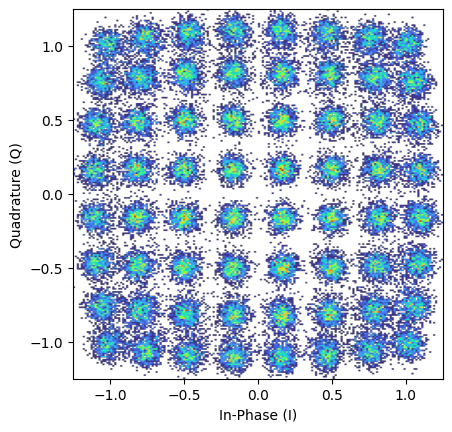

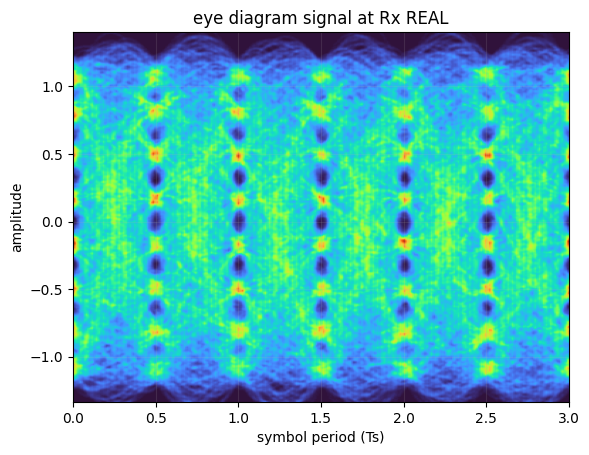

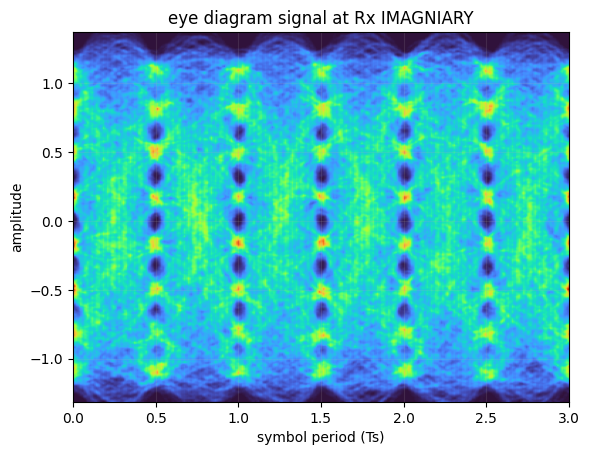

In [9]:
M = 64
nBits = 400000
SpSout = 2
paramSymb = intialise_paramSymb(M, nBits)

symbTx = symbolSource(paramSymb)


y_CPR_1, d, phaseEst = simulate_optical_system(symbTx, len(symbTx), M, PA_enable=True, Data_Aided=True, SpSout=SpSout)


perf_calc(symbTx, y_CPR_1, d, M, paramSymb)


discard = 5000
# plot constellations
pconst(y_CPR_1[discard:-discard])

# plotting eye diagrams of sigTx
eyediagram(y_CPR_1.real[discard:-discard], y_CPR_1.real.size-2*discard, SpSout, plotlabel='signal at Rx REAL', ptype='fancy')
eyediagram(y_CPR_1.imag[discard:-discard], y_CPR_1.imag.size-2*discard, SpSout, plotlabel='signal at Rx IMAGNIARY', ptype='fancy')


 Running:  M=16, Data_Aided=True, CPR_Mode=bps



Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0
da-rde MSE = 0.023947.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.023731.
da-rde pre-convergence training iteration #2
da-rde MSE = 0.023669.
rde - training stage #1
rde MSE = 0.016636.
Running frequency offset compensation...


 adied
yes bps


Estimated frequency offset (MHz): [128.24]
Running BPS carrier phase recovery...
Estimated linewidth: 275.425 kHz


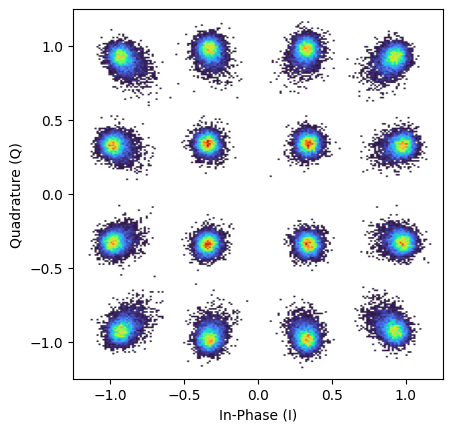

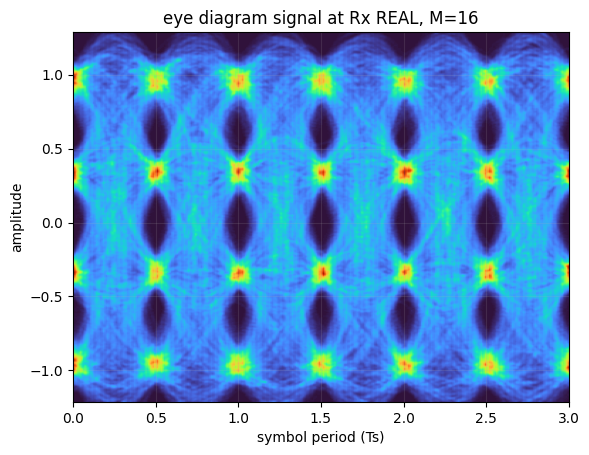

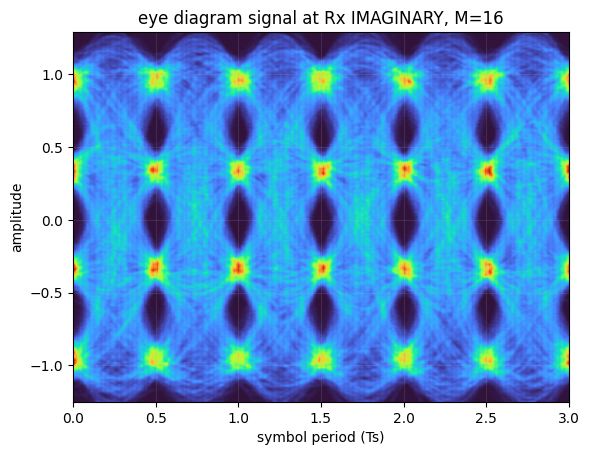

 SER: 1.000e-04,  
 BER: 2.500e-05   
 SNR: 21.837 dB
 EVM: 0.670 %
 Qfactor: 6.081,  

 Running:  M=16, Data_Aided=True, CPR_Mode=ddpll



Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0
da-rde MSE = 0.023947.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.023731.
da-rde pre-convergence training iteration #2
da-rde MSE = 0.023669.
rde - training stage #1
rde MSE = 0.016636.
Running frequency offset compensation...


 adied
no bps


Estimated frequency offset (MHz): [128.24]
Running DDPLL carrier phase recovery...
Estimated linewidth: 122.081 kHz


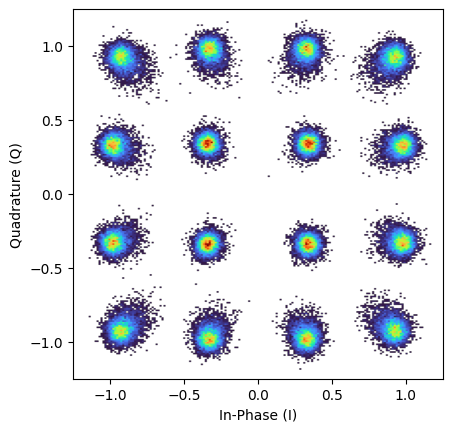

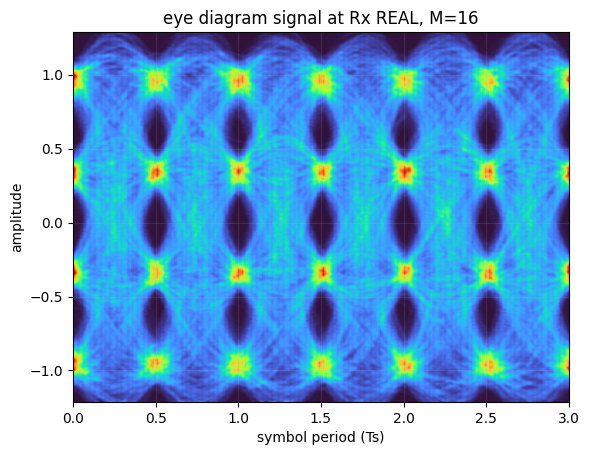

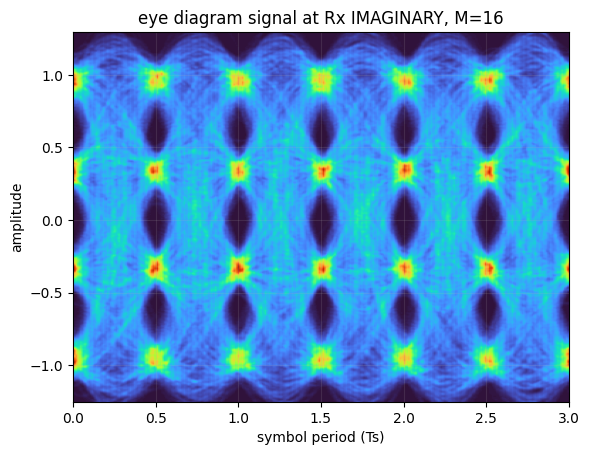

 SER: 1.444e-04,  
 BER: 3.889e-05   
 SNR: 21.653 dB
 EVM: 0.699 %
 Qfactor: 5.967,  

 Running:  M=16, Data_Aided=False, CPR_Mode=bps



Running adaptive equalizer...
cma - training stage #0
cma pre-convergence training iteration #0
cma MSE = 0.417935.
cma pre-convergence training iteration #1
cma MSE = 0.417652.
cma pre-convergence training iteration #2
cma MSE = 0.417533.
rde - training stage #1
rde MSE = 0.017183.
Running frequency offset compensation...


no adied
yes bps


Estimated frequency offset (MHz): [128.24]
Running BPS carrier phase recovery...
Estimated linewidth: 276.652 kHz


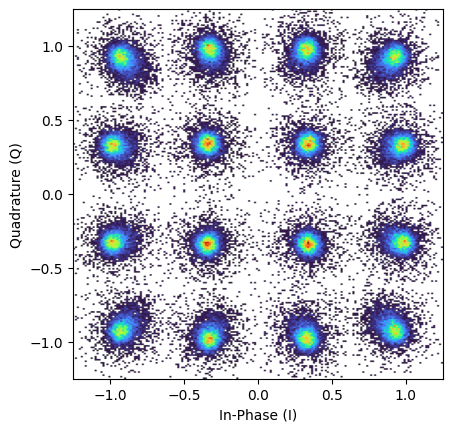

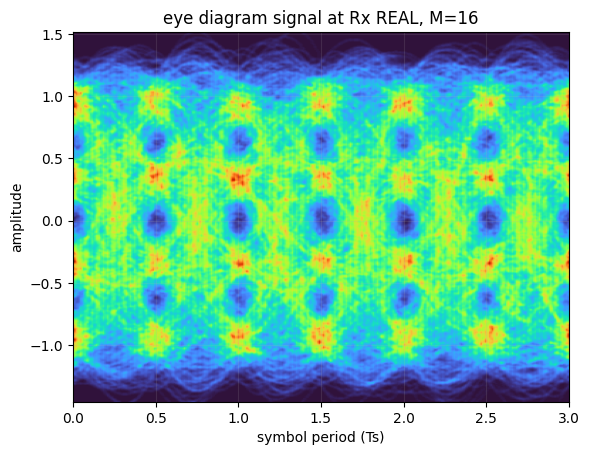

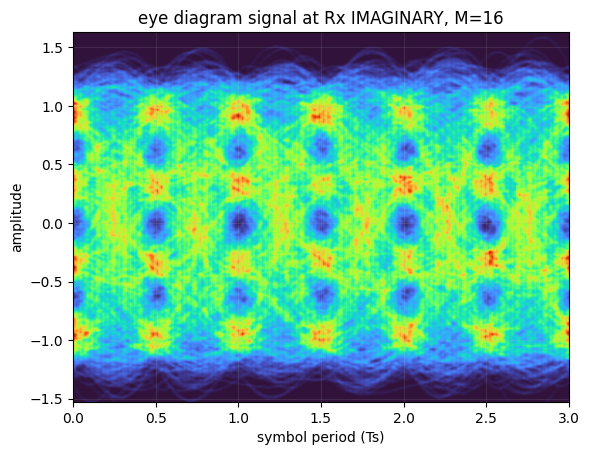

 SER: 7.389e-03,  
 BER: 1.869e-03   
 SNR: 19.268 dB
 EVM: 1.186 %
 Qfactor: 4.623,  

 Running:  M=16, Data_Aided=False, CPR_Mode=ddpll



Running adaptive equalizer...
cma - training stage #0
cma pre-convergence training iteration #0
cma MSE = 0.417935.
cma pre-convergence training iteration #1
cma MSE = 0.417652.
cma pre-convergence training iteration #2
cma MSE = 0.417533.
rde - training stage #1


no adied


rde MSE = 0.017183.
Running frequency offset compensation...
Estimated frequency offset (MHz): [128.24]
Running DDPLL carrier phase recovery...
Estimated linewidth: 128.483 kHz


no bps


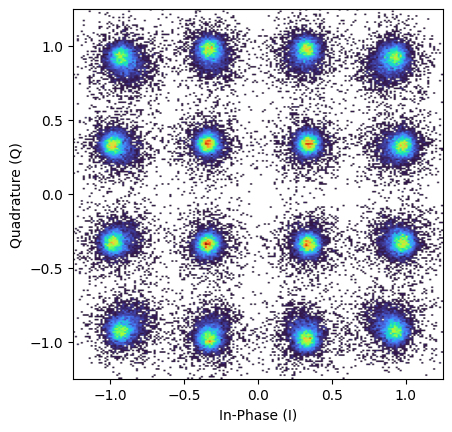

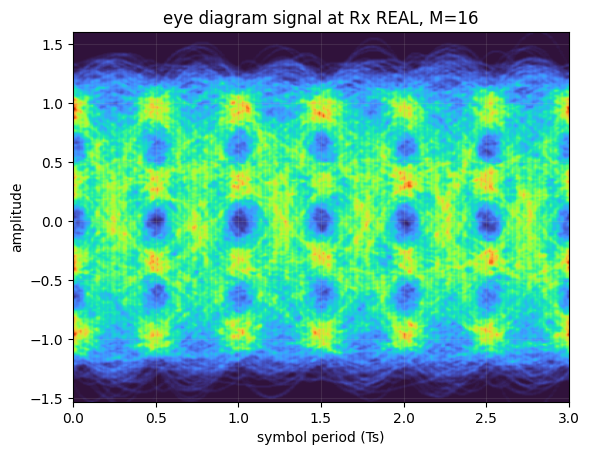

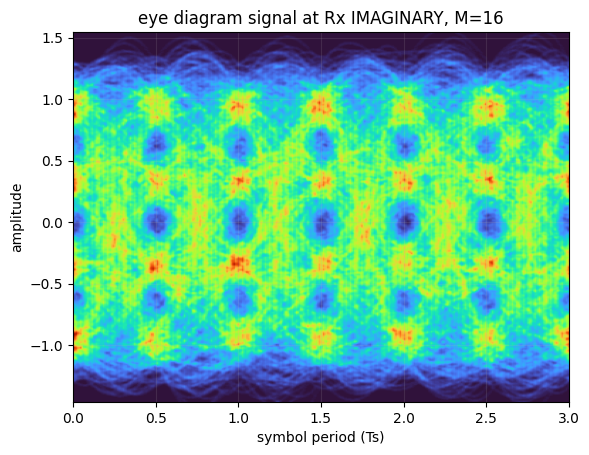

 SER: 7.156e-03,  
 BER: 1.806e-03   
 SNR: 19.127 dB
 EVM: 1.225 %
 Qfactor: 4.639,  

 Running:  M=64, Data_Aided=True, CPR_Mode=bps



Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0
da-rde MSE = 0.025568.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.024950.
da-rde pre-convergence training iteration #2
da-rde MSE = 0.024830.
da-rde pre-convergence training iteration #3
da-rde MSE = 0.024776.
da-rde pre-convergence training iteration #4
da-rde MSE = 0.024740.
da-rde pre-convergence training iteration #5
da-rde MSE = 0.024709.
rde - training stage #1


 adied


rde MSE = 0.007595.
Running frequency offset compensation...
Estimated frequency offset (MHz): [128.281]
Running BPS carrier phase recovery...


yes bps


Estimated linewidth: 24.728 kHz


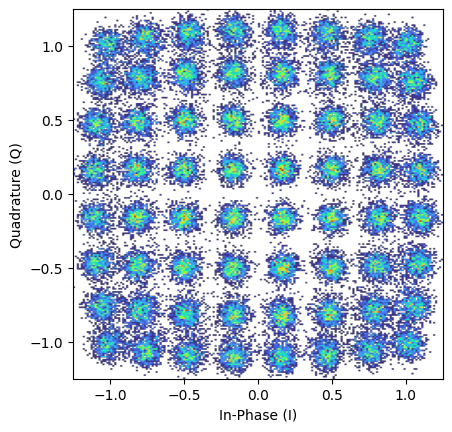

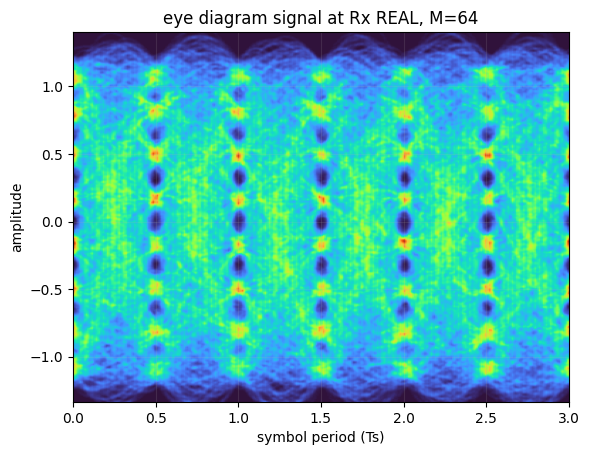

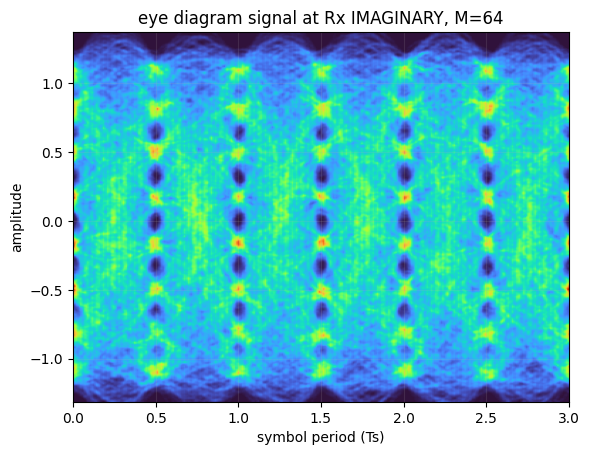

 SER: 4.202e-02,  
 BER: 7.838e-03   
 SNR: 20.668 dB
 EVM: 0.878 %
 Qfactor: 3.832,  

 Running:  M=64, Data_Aided=True, CPR_Mode=ddpll



Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0
da-rde MSE = 0.025568.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.024950.
da-rde pre-convergence training iteration #2
da-rde MSE = 0.024830.
da-rde pre-convergence training iteration #3
da-rde MSE = 0.024776.
da-rde pre-convergence training iteration #4
da-rde MSE = 0.024740.
da-rde pre-convergence training iteration #5


 adied


da-rde MSE = 0.024709.
rde - training stage #1
rde MSE = 0.007595.
Running frequency offset compensation...
Estimated frequency offset (MHz): [128.281]
Running DDPLL carrier phase recovery...
Estimated linewidth: 89.581 kHz


no bps


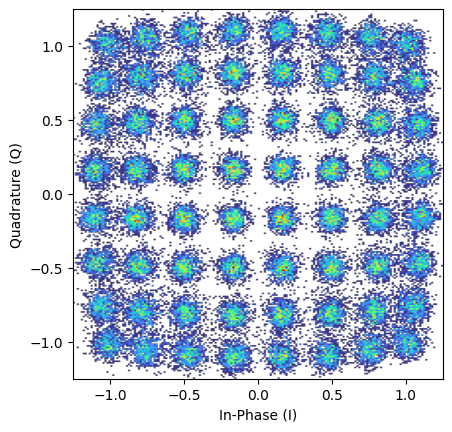

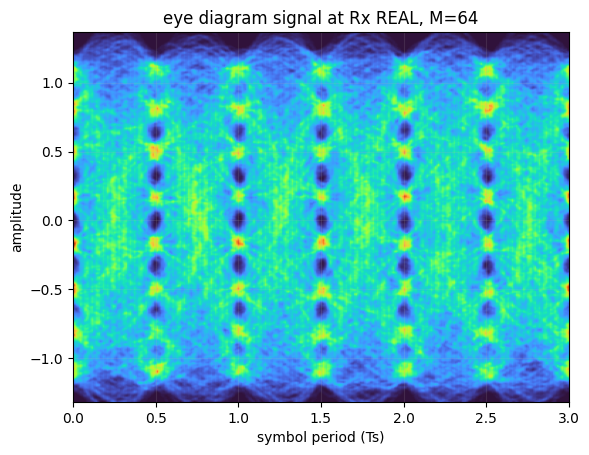

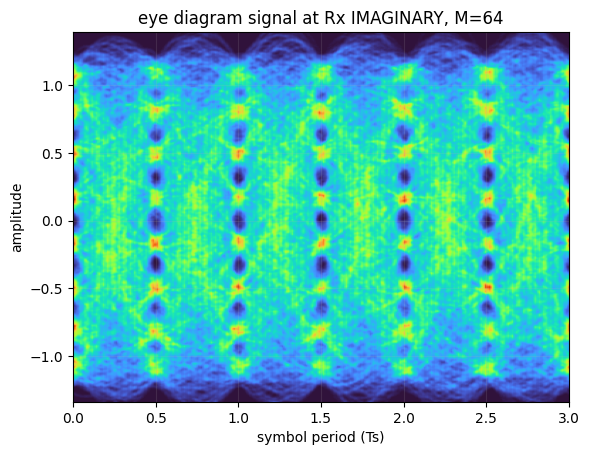

 SER: 4.482e-02,  
 BER: 8.291e-03   
 SNR: 20.529 dB
 EVM: 0.906 %
 Qfactor: 3.795,  

 Running:  M=64, Data_Aided=False, CPR_Mode=bps



Running adaptive equalizer...
cma - training stage #0
cma pre-convergence training iteration #0
cma MSE = 0.465968.
cma pre-convergence training iteration #1
cma MSE = 0.466069.
cma pre-convergence training iteration #2
cma MSE = 0.465934.
cma pre-convergence training iteration #3
cma MSE = 0.465829.
cma pre-convergence training iteration #4
cma MSE = 0.465745.
rde - training stage #1


no adied


rde MSE = 0.008998.
Running frequency offset compensation...
Estimated frequency offset (MHz): [127.681]
Running BPS carrier phase recovery...


yes bps


Estimated linewidth: 2093.823 kHz


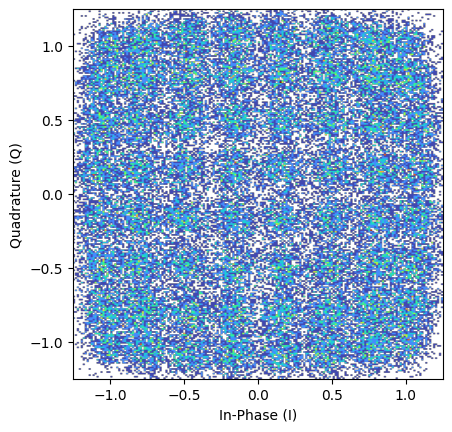

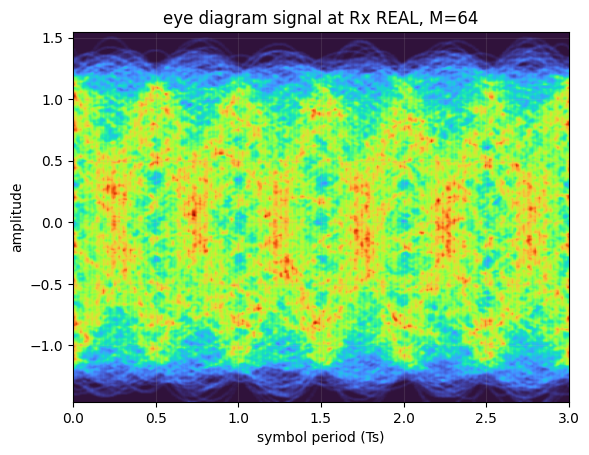

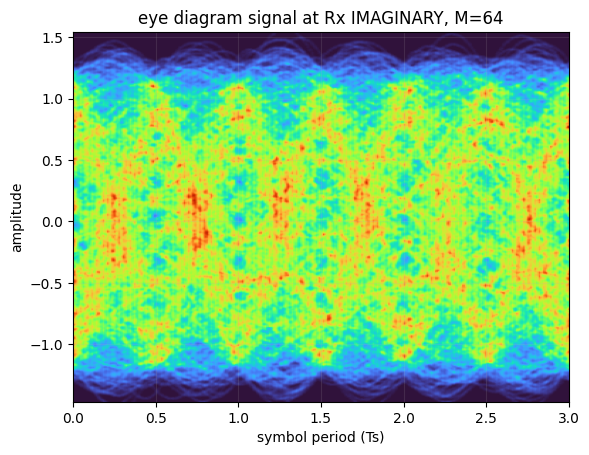

 SER: 2.494e-01,  
 BER: 4.509e-02   
 SNR: 16.453 dB
 EVM: 2.255 %
 Qfactor: 2.290,  

 Running:  M=64, Data_Aided=False, CPR_Mode=ddpll



Running adaptive equalizer...
cma - training stage #0
cma pre-convergence training iteration #0
cma MSE = 0.465968.
cma pre-convergence training iteration #1
cma MSE = 0.466069.
cma pre-convergence training iteration #2
cma MSE = 0.465934.
cma pre-convergence training iteration #3
cma MSE = 0.465829.
cma pre-convergence training iteration #4
cma MSE = 0.465745.
rde - training stage #1


no adied


rde MSE = 0.008998.
Running frequency offset compensation...
Estimated frequency offset (MHz): [127.681]
Running DDPLL carrier phase recovery...
Estimated linewidth: 186.192 kHz


no bps


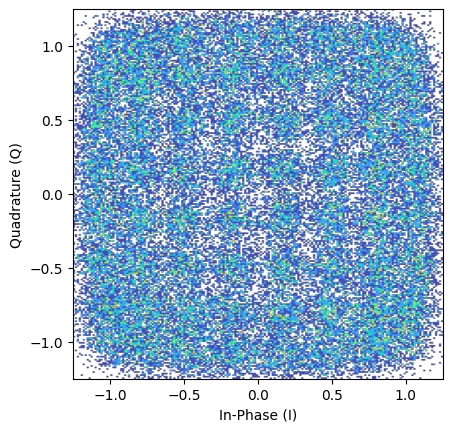

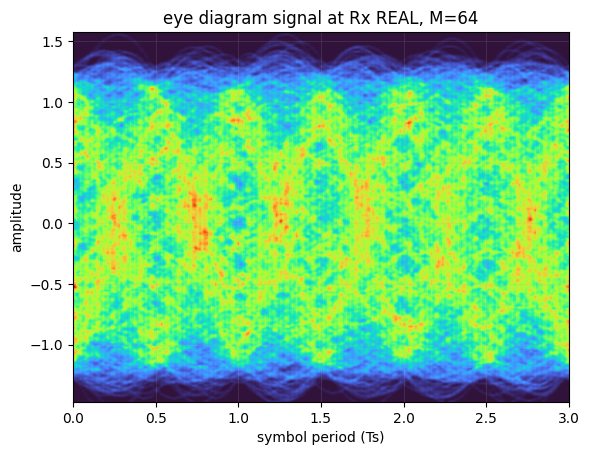

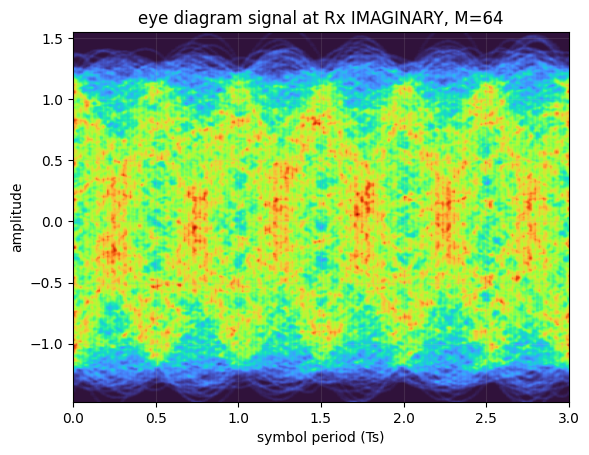

 SER: 2.879e-01,  
 BER: 5.296e-02   
 SNR: 15.787 dB
 EVM: 2.625 %
 Qfactor: 2.087,  

 Running:  M=256, Data_Aided=True, CPR_Mode=bps



Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0
da-rde MSE = 0.046103.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.045999.
da-rde pre-convergence training iteration #2


 adied


da-rde MSE = 0.045989.
da-rde pre-convergence training iteration #3
da-rde MSE = 0.045983.
da-rde pre-convergence training iteration #4
da-rde MSE = 0.045978.
da-rde pre-convergence training iteration #5
da-rde MSE = 0.045973.
da-rde - training stage #1
da-rde MSE = 0.071570.
Running frequency offset compensation...
Estimated frequency offset (MHz): [127.677]
Running BPS carrier phase recovery...


yes bps


Estimated linewidth: 7023.881 kHz


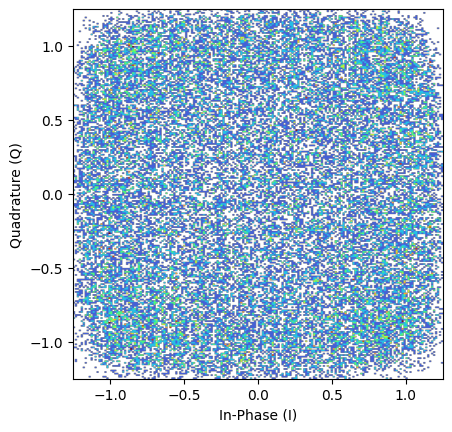

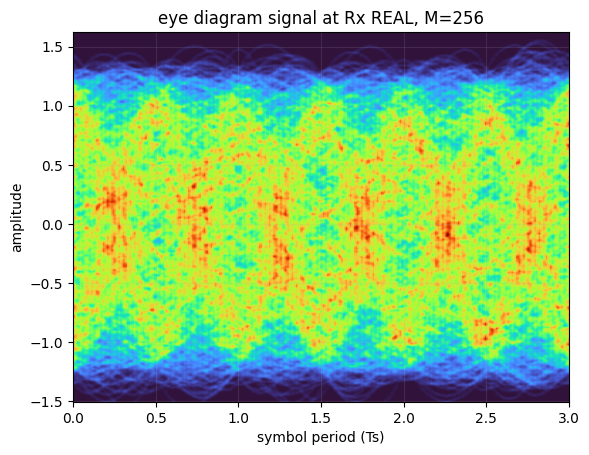

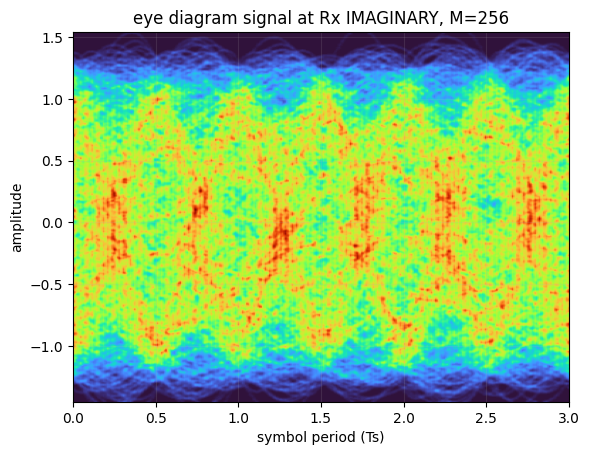

 SER: 6.042e-01,  
 BER: 1.029e-01   
 SNR: 17.046 dB
 EVM: 1.989 %
 Qfactor: 1.022,  

 Running:  M=256, Data_Aided=True, CPR_Mode=ddpll



Running adaptive equalizer...
da-rde - training stage #0
da-rde pre-convergence training iteration #0
da-rde MSE = 0.046103.
da-rde pre-convergence training iteration #1
da-rde MSE = 0.045999.
da-rde pre-convergence training iteration #2


 adied


da-rde MSE = 0.045989.
da-rde pre-convergence training iteration #3
da-rde MSE = 0.045983.
da-rde pre-convergence training iteration #4
da-rde MSE = 0.045978.
da-rde pre-convergence training iteration #5
da-rde MSE = 0.045973.
da-rde - training stage #1
da-rde MSE = 0.071570.
Running frequency offset compensation...
Estimated frequency offset (MHz): [127.677]
Running DDPLL carrier phase recovery...
Estimated linewidth: 154.830 kHz


no bps


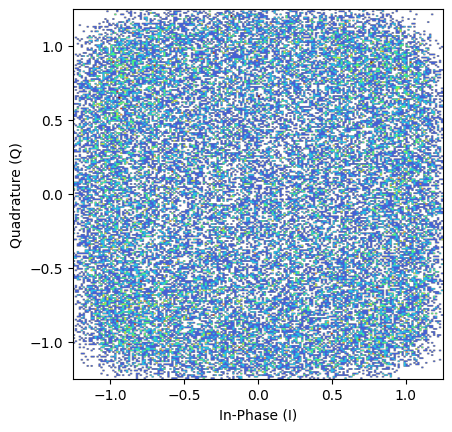

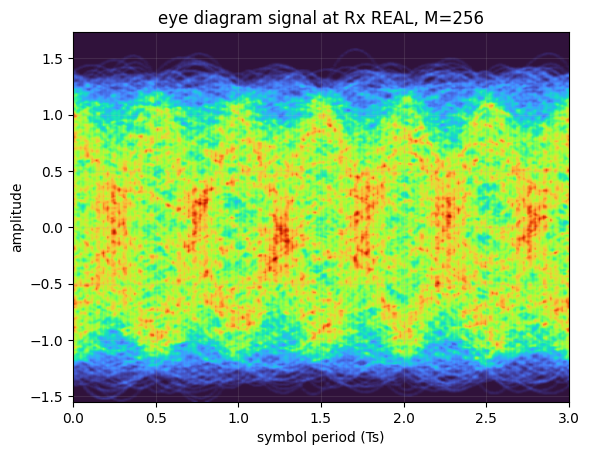

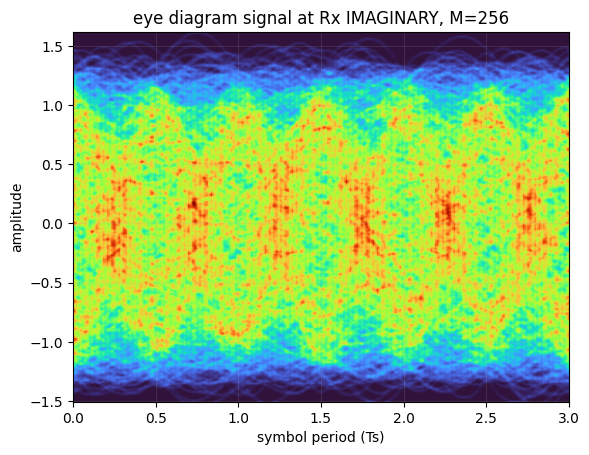

 SER: 7.003e-01,  
 BER: 1.296e-01   
 SNR: 15.503 dB
 EVM: 2.821 %
 Qfactor: 0.525,  

 Running:  M=256, Data_Aided=False, CPR_Mode=bps



Running adaptive equalizer...
cma - training stage #0
cma pre-convergence training iteration #0
cma MSE = 0.481135.
cma pre-convergence training iteration #1
cma MSE = 0.481392.
cma pre-convergence training iteration #2
cma MSE = 0.481315.
cma pre-convergence training iteration #3
cma MSE = 0.481253.
cma pre-convergence training iteration #4
cma MSE = 0.481203.
cma pre-convergence training iteration #5
cma MSE = 0.481162.
rde - training stage #1
rde MSE = 0.000841.


no adied
yes bps


Running frequency offset compensation...
Estimated frequency offset (MHz): [127.68]
Running BPS carrier phase recovery...
Estimated linewidth: 8276.884 kHz


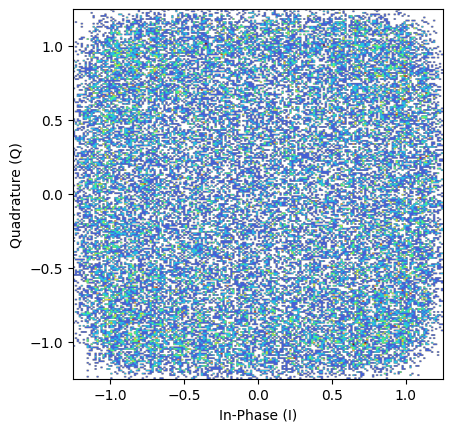

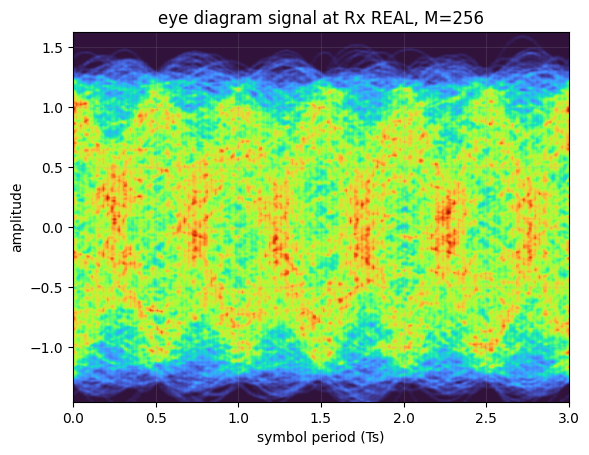

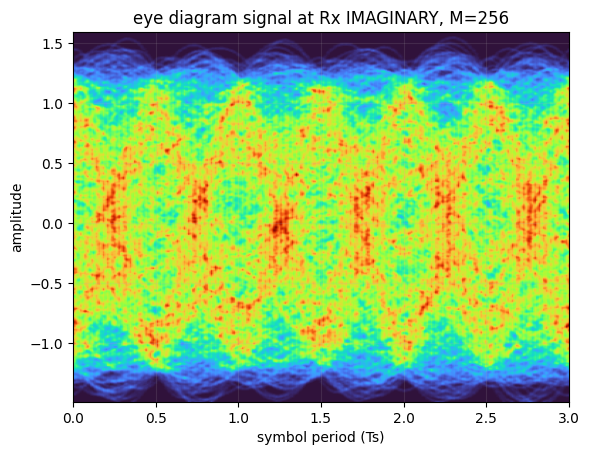

 SER: 6.696e-01,  
 BER: 1.139e-01   
 SNR: 16.656 dB
 EVM: 2.175 %
 Qfactor: 0.813,  

 Running:  M=256, Data_Aided=False, CPR_Mode=ddpll



Running adaptive equalizer...
cma - training stage #0
cma pre-convergence training iteration #0
cma MSE = 0.481135.
cma pre-convergence training iteration #1
cma MSE = 0.481392.
cma pre-convergence training iteration #2
cma MSE = 0.481315.
cma pre-convergence training iteration #3
cma MSE = 0.481253.
cma pre-convergence training iteration #4
cma MSE = 0.481203.
cma pre-convergence training iteration #5
cma MSE = 0.481162.
rde - training stage #1


no adied


rde MSE = 0.000841.
Running frequency offset compensation...
Estimated frequency offset (MHz): [127.68]
Running DDPLL carrier phase recovery...


no bps


Estimated linewidth: 157.590 kHz


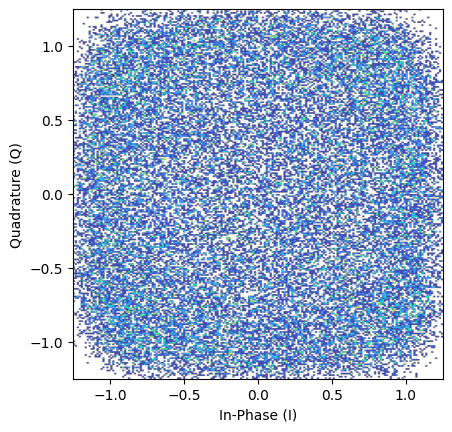

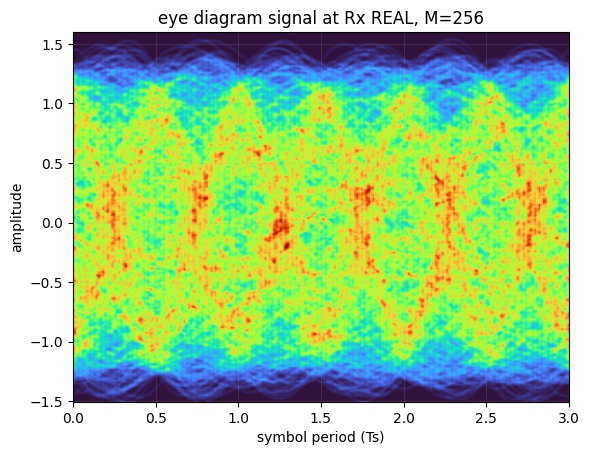

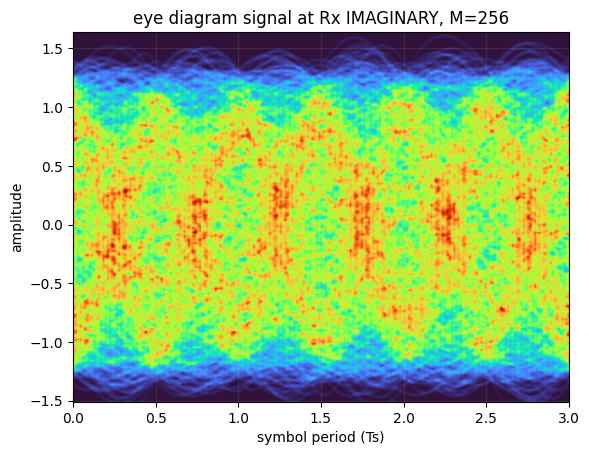

 SER: 7.202e-01,  
 BER: 1.342e-01   
 SNR: 15.178 dB
 EVM: 3.039 %
 Qfactor: 0.440,  


In [10]:
results = []

# modulation orders to test
mod_orders = [16,64,256]

# DA and CPR modes
modes_DataAided = [True, False]
modes_CPR = [ "bps","ddpll"]

for M_test in mod_orders:
    M = M_test
    paramSymb = intialise_paramSymb(M, nBits) # need to update it everytime M changes
    for da in modes_DataAided:
        for cpr_mode in modes_CPR:
            print("\n===================================================")
            print(f" Running:  M={M}, Data_Aided={da}, CPR_Mode={cpr_mode}")
            print("===================================================\n")
        
            # fresh symbol stream each run
            symbTx = symbolSource(paramSymb)
            
            # run sys
            y_CPR_1, d, phaseEst = simulate_optical_system(symbTx, len(symbTx), M, 
                                                           Data_Aided=da, 
                                                           SpSout=SpSout,
                                                           CPR_Mode=cpr_mode)

            discard = 5000

            # optional: plot constellations
            pconst(y_CPR_1[discard:-discard])

            # plotting eye diagrams
            eyediagram(y_CPR_1.real[discard:-discard],
                        y_CPR_1.real.size-2*discard,
                        SpSout,
                        plotlabel=f'signal at Rx REAL, M={M}', ptype='fancy')
            eyediagram(y_CPR_1.imag[discard:-discard],
                        y_CPR_1.imag.size-2*discard,
                        SpSout,
                        plotlabel=f'signal at Rx IMAGINARY, M={M}', ptype='fancy')


            # performance
            BER, SER, SNR, EVM, Q = perf_calc(symbTx, y_CPR_1, d, M, paramSymb)


            results.append({
                "Modulation": M,
                "Data_Aided": da,
                "CPR": cpr_mode,
                "BER": BER,
                "SER": SER,
                "SNR": SNR,
                "EVM": EVM,
                "Qfactor": Q
            })

In [11]:
print("\n==================== SUMMARY TABLE ====================\n")
for r in results:
    print(f"DA={r['Data_Aided']}, CPR={r['CPR']}: "
          f"BER={r['BER']:.2e}, SER={r['SER']:.2e}, "
          f"SNR={r['SNR']:.2f} dB, EVM={r['EVM']*100:.1f} %, Q={r['Qfactor']:.2f}")


==================== SUMMARY TABLE ====================

DA=True, CPR=bps: BER=2.50e-05, SER=1.00e-04, SNR=21.84 dB, EVM=0.7 %, Q=6.08
DA=True, CPR=ddpll: BER=3.89e-05, SER=1.44e-04, SNR=21.65 dB, EVM=0.7 %, Q=5.97
DA=False, CPR=bps: BER=1.87e-03, SER=7.39e-03, SNR=19.27 dB, EVM=1.2 %, Q=4.62
DA=False, CPR=ddpll: BER=1.81e-03, SER=7.16e-03, SNR=19.13 dB, EVM=1.2 %, Q=4.64
DA=True, CPR=bps: BER=7.84e-03, SER=4.20e-02, SNR=20.67 dB, EVM=0.9 %, Q=3.83
DA=True, CPR=ddpll: BER=8.29e-03, SER=4.48e-02, SNR=20.53 dB, EVM=0.9 %, Q=3.79
DA=False, CPR=bps: BER=4.51e-02, SER=2.49e-01, SNR=16.45 dB, EVM=2.3 %, Q=2.29
DA=False, CPR=ddpll: BER=5.30e-02, SER=2.88e-01, SNR=15.79 dB, EVM=2.6 %, Q=2.09
DA=True, CPR=bps: BER=1.03e-01, SER=6.04e-01, SNR=17.05 dB, EVM=2.0 %, Q=1.02
DA=True, CPR=ddpll: BER=1.30e-01, SER=7.00e-01, SNR=15.50 dB, EVM=2.8 %, Q=0.52
DA=False, CPR=bps: BER=1.14e-01, SER=6.70e-01, SNR=16.66 dB, EVM=2.2 %, Q=0.81
DA=False, CPR=ddpll: BER=1.34e-01, SER=7.20e-01, SNR=15.18 dB, EVM=3.